FILTRO BAYER SOBRE IMAGEN A COLOR - CON ROJO Y AZUL INTENSIFICADOS

🎯 Cada píxel CONSERVA SU COLOR ORIGINAL pero solo se muestra el canal correspondiente
   a su posición en el filtro Bayer, con rojo y azul intensificados

1. FILTRO BAYER con rojo x2.0, azul x2.0:


C:\Users\Estudiante\AppData\Local\Temp\ipykernel_12948\2002195531.py:177: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\Estudiante\AppData\Local\Temp\ipykernel_12948\2002195531.py:177: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\Estudiante\AppData\Local\Temp\ipykernel_12948\2002195531.py:177: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


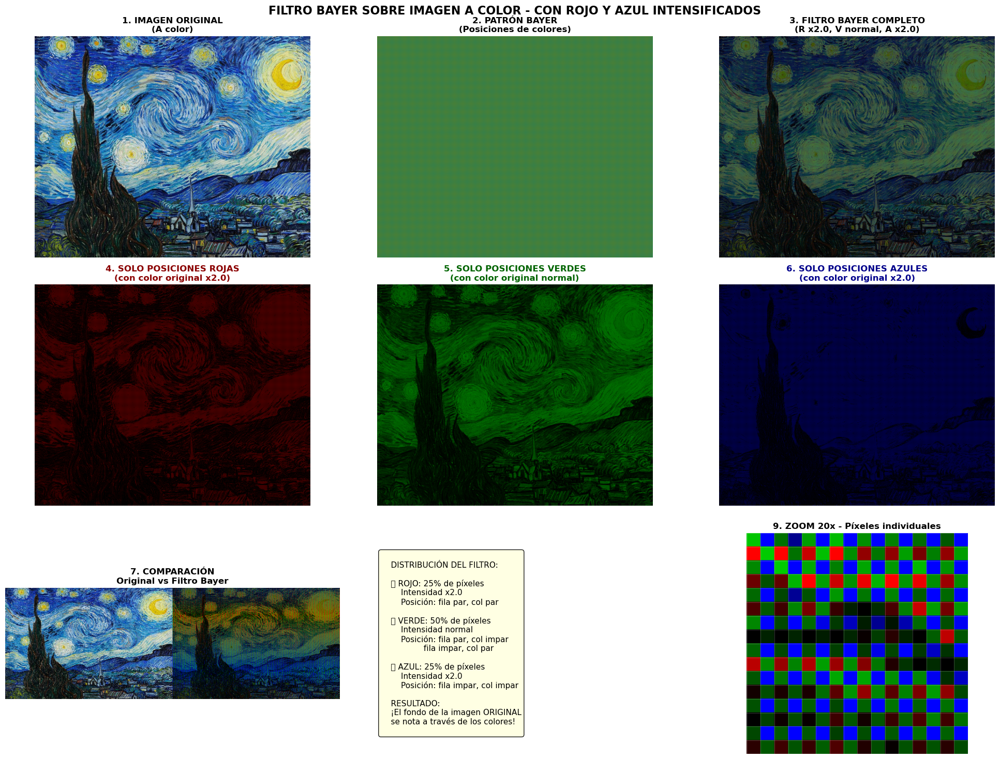


2. Prueba de diferentes intensidades:


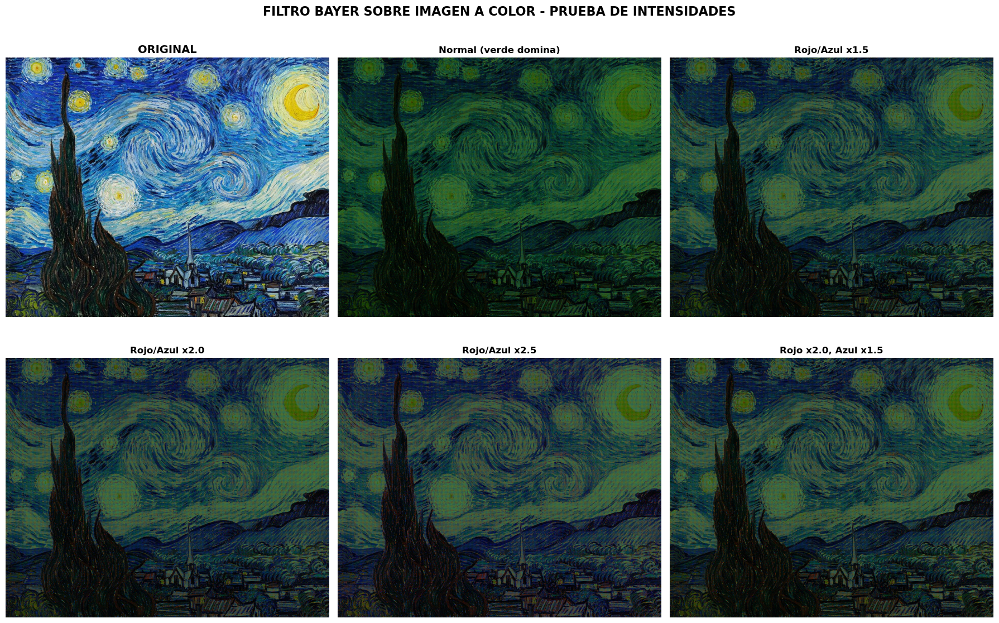


✅ RESULTADO:
   - La imagen ORIGINAL A COLOR se nota de fondo
   - Los píxeles rojos y azules están intensificados x2.0
   - Se ve claramente el patrón de cuadrícula del filtro Bayer


In [45]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def filtro_bayer_con_color_original(imagen_path, intensidad_rojo=2.0, intensidad_azul=2.0):
    """
    FILTRO BAYER aplicado a IMAGEN A COLOR:
    - Cada píxel conserva su color original pero SOLO el canal correspondiente a su posición
    - Rojo y azul se INTENSIFICAN para compensar su menor cantidad de píxeles
    - El fondo de la imagen ORIGINAL se nota a través de los colores
    """
    # Cargar imagen A COLOR
    img = cv2.imread(imagen_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    h, w = img_rgb.shape[:2]
    
    # Separar canales originales (a float para poder multiplicar)
    r_original = img_rgb[:, :, 0].astype(np.float32)
    g_original = img_rgb[:, :, 1].astype(np.float32)
    b_original = img_rgb[:, :, 2].astype(np.float32)
    
    # Aplicar intensidades a rojo y azul
    r_intenso = np.clip(r_original * intensidad_rojo, 0, 255).astype(np.uint8)
    g_normal = g_original.astype(np.uint8)
    b_intenso = np.clip(b_original * intensidad_azul, 0, 255).astype(np.uint8)
    
    # Crear filtros para cada canal
    filtro_rojo = np.zeros_like(img_rgb)
    filtro_verde = np.zeros_like(img_rgb)
    filtro_azul = np.zeros_like(img_rgb)
    filtro_completo = np.zeros_like(img_rgb)
    
    # Imagen que muestra SOLO las posiciones (para ver el patrón)
    patron_posiciones = np.zeros_like(img_rgb)
    
    for i in range(h):
        for j in range(w):
            # Determinar color según posición (para el patrón)
            if i % 2 == 0:  # Fila par
                if j % 2 == 0:  # Col par - ROJO
                    color_texto = 'R'
                    # En el filtro rojo: poner el valor rojo intensificado
                    filtro_rojo[i, j, 0] = r_intenso[i, j]
                    # En el filtro completo: poner el valor rojo intensificado
                    filtro_completo[i, j, 0] = r_intenso[i, j]
                    # Patrón de posiciones (color puro para ver la cuadrícula)
                    patron_posiciones[i, j, 0] = 255
                else:  # Col impar - VERDE
                    color_texto = 'G'
                    # En el filtro verde: poner el valor verde normal
                    filtro_verde[i, j, 1] = g_normal[i, j]
                    # En el filtro completo: poner el valor verde normal
                    filtro_completo[i, j, 1] = g_normal[i, j]
                    # Patrón de posiciones
                    patron_posiciones[i, j, 1] = 255
            else:  # Fila impar
                if j % 2 == 0:  # Col par - VERDE
                    color_texto = 'G'
                    # En el filtro verde: poner el valor verde normal
                    filtro_verde[i, j, 1] = g_normal[i, j]
                    # En el filtro completo: poner el valor verde normal
                    filtro_completo[i, j, 1] = g_normal[i, j]
                    # Patrón de posiciones
                    patron_posiciones[i, j, 1] = 255
                else:  # Col impar - AZUL
                    color_texto = 'B'
                    # En el filtro azul: poner el valor azul intensificado
                    filtro_azul[i, j, 2] = b_intenso[i, j]
                    # En el filtro completo: poner el valor azul intensificado
                    filtro_completo[i, j, 2] = b_intenso[i, j]
                    # Patrón de posiciones
                    patron_posiciones[i, j, 2] = 255
    
    # Mostrar resultados
    plt.figure(figsize=(20, 15))
    
    # 1. Imagen original
    plt.subplot(3, 3, 1)
    plt.imshow(img_rgb)
    plt.title('1. IMAGEN ORIGINAL\n(A color)', fontsize=12, fontweight='bold')
    plt.axis('off')
    
    # 2. Patrón de posiciones (para ver la cuadrícula)
    plt.subplot(3, 3, 2)
    plt.imshow(patron_posiciones)
    plt.title('2. PATRÓN BAYER\n(Posiciones de colores)', fontsize=12, fontweight='bold')
    plt.axis('off')
    
    # 3. Filtro completo
    plt.subplot(3, 3, 3)
    plt.imshow(filtro_completo)
    plt.title(f'3. FILTRO BAYER COMPLETO\n(R x{intensidad_rojo}, V normal, A x{intensidad_azul})', 
              fontsize=12, fontweight='bold')
    plt.axis('off')
    
    # 4. Solo ROJO (con color original intensificado)
    plt.subplot(3, 3, 4)
    plt.imshow(filtro_rojo)
    plt.title(f'4. SOLO POSICIONES ROJAS\n(con color original x{intensidad_rojo})', 
              fontsize=12, fontweight='bold', color='darkred')
    plt.axis('off')
    
    # 5. Solo VERDE (con color original normal)
    plt.subplot(3, 3, 5)
    plt.imshow(filtro_verde)
    plt.title('5. SOLO POSICIONES VERDES\n(con color original normal)', 
              fontsize=12, fontweight='bold', color='darkgreen')
    plt.axis('off')
    
    # 6. Solo AZUL (con color original intensificado)
    plt.subplot(3, 3, 6)
    plt.imshow(filtro_azul)
    plt.title(f'6. SOLO POSICIONES AZULES\n(con color original x{intensidad_azul})', 
              fontsize=12, fontweight='bold', color='darkblue')
    plt.axis('off')
    
    # 7. Comparación: Original vs Filtro (lado a lado)
    plt.subplot(3, 3, 7)
    comparacion = np.hstack([
        cv2.resize(img_rgb, (300, 200)),
        cv2.resize(filtro_completo, (300, 200))
    ])
    plt.imshow(comparacion)
    plt.title('7. COMPARACIÓN\nOriginal vs Filtro Bayer', fontsize=12, fontweight='bold')
    plt.axis('off')
    
    # 8. Información de distribución
    plt.subplot(3, 3, 8)
    info = f"""
    DISTRIBUCIÓN DEL FILTRO:
    
    🔴 ROJO: 25% de píxeles
        Intensidad x{intensidad_rojo}
        Posición: fila par, col par
    
    🟢 VERDE: 50% de píxeles
        Intensidad normal
        Posición: fila par, col impar
                 fila impar, col par
    
    🔵 AZUL: 25% de píxeles
        Intensidad x{intensidad_azul}
        Posición: fila impar, col impar
    
    RESULTADO:
    ¡El fondo de la imagen ORIGINAL
    se nota a través de los colores!
    """
    plt.text(0.1, 0.5, info, fontsize=11, verticalalignment='center',
             bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.9))
    plt.axis('off')
    
    # 9. Zoom de una región
    plt.subplot(3, 3, 9)
    # Tomar una región pequeña
    region = filtro_completo[h//2-8:h//2+8, w//2-8:w//2+8]
    # Hacer zoom
    zoom_factor = 20
    zoom = np.zeros((region.shape[0]*zoom_factor, region.shape[1]*zoom_factor, 3), dtype=np.uint8)
    for i in range(region.shape[0]):
        for j in range(region.shape[1]):
            zoom[i*zoom_factor:(i+1)*zoom_factor, j*zoom_factor:(j+1)*zoom_factor] = region[i, j]
    
    plt.imshow(zoom)
    plt.title(f'9. ZOOM {zoom_factor}x - Píxeles individuales', fontsize=12, fontweight='bold')
    plt.axis('off')
    
    # Cuadrícula en el zoom
    for i in range(0, zoom.shape[0], zoom_factor):
        plt.axhline(y=i, color='white', linewidth=0.5, alpha=0.3)
    for j in range(0, zoom.shape[1], zoom_factor):
        plt.axvline(x=j, color='white', linewidth=0.5, alpha=0.3)
    
    plt.suptitle(f'FILTRO BAYER SOBRE IMAGEN A COLOR - CON ROJO Y AZUL INTENSIFICADOS', 
                fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return filtro_completo

def probar_diferentes_intensidades_color(imagen_path):
    """
    Prueba diferentes intensidades para rojo y azul sobre la imagen a color
    """
    img = cv2.imread(imagen_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img_rgb.shape[:2]
    
    # Separar canales
    r = img_rgb[:, :, 0].astype(np.float32)
    g = img_rgb[:, :, 1].astype(np.float32)
    b = img_rgb[:, :, 2].astype(np.float32)
    
    # Combinaciones a probar
    combinaciones = [
        (1.0, 1.0, "Normal (verde domina)"),
        (1.5, 1.5, "Rojo/Azul x1.5"),
        (2.0, 2.0, "Rojo/Azul x2.0"),
        (2.5, 2.5, "Rojo/Azul x2.5"),
        (2.0, 1.5, "Rojo x2.0, Azul x1.5"),
        (1.5, 2.0, "Rojo x1.5, Azul x2.0")
    ]
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    
    # Original
    axes[0, 0].imshow(img_rgb)
    axes[0, 0].set_title('ORIGINAL', fontsize=14, fontweight='bold')
    axes[0, 0].axis('off')
    
    for idx, (int_r, int_b, desc) in enumerate(combinaciones[:5]):
        # Crear filtro
        r_int = np.clip(r * int_r, 0, 255).astype(np.uint8)
        b_int = np.clip(b * int_b, 0, 255).astype(np.uint8)
        g_norm = g.astype(np.uint8)
        
        filtro = np.zeros_like(img_rgb)
        for i in range(h):
            for j in range(w):
                if i % 2 == 0:
                    if j % 2 == 0:
                        filtro[i, j, 0] = r_int[i, j]
                    else:
                        filtro[i, j, 1] = g_norm[i, j]
                else:
                    if j % 2 == 0:
                        filtro[i, j, 1] = g_norm[i, j]
                    else:
                        filtro[i, j, 2] = b_int[i, j]
        
        row, col = (idx + 1) // 3, (idx + 1) % 3
        axes[row, col].imshow(filtro)
        axes[row, col].set_title(f'{desc}', fontsize=12, fontweight='bold')
        axes[row, col].axis('off')
    
    axes[1, 2].axis('off')
    plt.suptitle('FILTRO BAYER SOBRE IMAGEN A COLOR - PRUEBA DE INTENSIDADES', 
                fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

# EJECUCIÓN
if __name__ == "__main__":
    imagen_path = 'paisaje.jpg'  # Tu imagen a color
    
    print("="*70)
    print("FILTRO BAYER SOBRE IMAGEN A COLOR - CON ROJO Y AZUL INTENSIFICADOS")
    print("="*70)
    
    print("\n🎯 Cada píxel CONSERVA SU COLOR ORIGINAL pero solo se muestra el canal correspondiente")
    print("   a su posición en el filtro Bayer, con rojo y azul intensificados")
    
    # Versión recomendada
    print("\n1. FILTRO BAYER con rojo x2.0, azul x2.0:")
    resultado = filtro_bayer_con_color_original(imagen_path, intensidad_rojo=2.0, intensidad_azul=2.0)
    
    # Probar diferentes intensidades
    print("\n2. Prueba de diferentes intensidades:")
    probar_diferentes_intensidades_color(imagen_path)
    
    print("\n✅ RESULTADO:")
    print("   - La imagen ORIGINAL A COLOR se nota de fondo")
    print("   - Los píxeles rojos y azules están intensificados x2.0")
    print("   - Se ve claramente el patrón de cuadrícula del filtro Bayer")

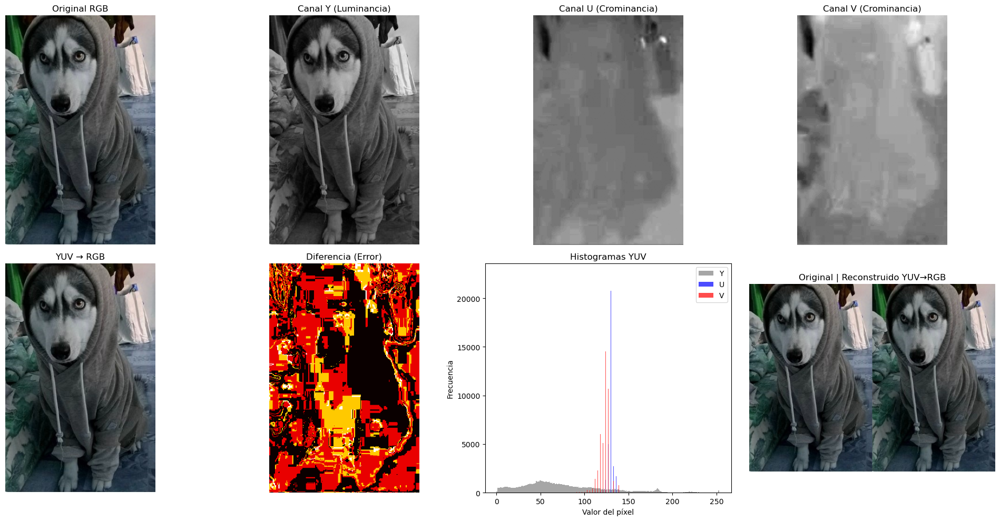

Pérdida promedio en transformación RGB↔YUV↔RGB: 0.2510


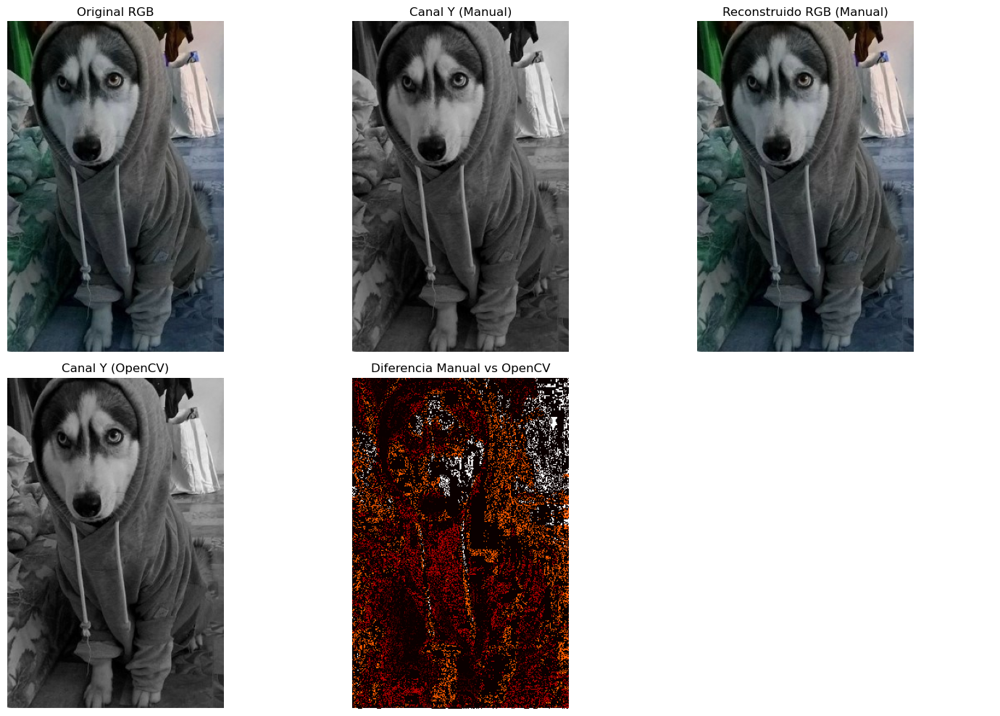

Error medio entre implementación manual y OpenCV: 0.000000


In [ ]:
def transformaciones_yuv_rgb(imagen_path):
    """
    Aplica transformaciones entre YUV y RGB
    """
    # Cargar imagen
    img = cv2.imread(imagen_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 1. RGB a YUV
    img_yuv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2YUV)
    
    # Separar canales YUV
    y_channel, u_channel, v_channel = cv2.split(img_yuv)
    
    # 2. YUV a RGB
    img_reconstruida_rgb = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)
    
    # 3. RGB a YUV (otra versión)
    img_yuv_alt = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2YUV)
    img_rgb_alt = cv2.cvtColor(img_yuv_alt, cv2.COLOR_YUV2RGB)
    
    # Visualización
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    axes = axes.ravel()
    
    # Imagen original
    axes[0].imshow(img_rgb)
    axes[0].set_title('Original RGB')
    axes[0].axis('off')
    
    # Canales YUV
    axes[1].imshow(y_channel, cmap='gray')
    axes[1].set_title('Canal Y (Luminancia)')
    axes[1].axis('off')
    
    axes[2].imshow(u_channel, cmap='gray')
    axes[2].set_title('Canal U (Crominancia)')
    axes[2].axis('off')
    
    axes[3].imshow(v_channel, cmap='gray')
    axes[3].set_title('Canal V (Crominancia)')
    axes[3].axis('off')
    
    # Reconstrucciones
    axes[4].imshow(img_reconstruida_rgb)
    axes[4].set_title('YUV → RGB')
    axes[4].axis('off')
    
    # Diferencia entre original y reconstruida
    diferencia = cv2.absdiff(img_rgb.astype(np.float32), img_reconstruida_rgb.astype(np.float32))
    axes[5].imshow(diferencia.mean(axis=2), cmap='hot')
    axes[5].set_title('Diferencia (Error)')
    axes[5].axis('off')
    
    # Histogramas de canales YUV
    axes[6].hist(y_channel.ravel(), bins=256, alpha=0.7, label='Y', color='gray')
    axes[6].hist(u_channel.ravel(), bins=256, alpha=0.7, label='U', color='blue')
    axes[6].hist(v_channel.ravel(), bins=256, alpha=0.7, label='V', color='red')
    axes[6].set_title('Histogramas YUV')
    axes[6].legend()
    axes[6].set_xlabel('Valor del píxel')
    axes[6].set_ylabel('Frecuencia')
    
    # Comparación RGB vs YUV reconstruido
    axes[7].imshow(np.hstack([img_rgb, img_reconstruida_rgb]))
    axes[7].set_title('Original | Reconstruido YUV→RGB')
    axes[7].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Verificar si hay pérdida en la transformación
    perdida = np.mean(np.abs(img_rgb.astype(np.float32) - img_reconstruida_rgb.astype(np.float32)))
    print(f"Pérdida promedio en transformación RGB↔YUV↔RGB: {perdida:.4f}")
    
    return {
        'original_rgb': img_rgb,
        'yuv': img_yuv,
        'reconstruido_rgb': img_reconstruida_rgb
    }

# Aplicar transformaciones
resultados_color = transformaciones_yuv_rgb('pg.jpg')  # Reemplaza con tu imagen

def transformacion_manual_rgb_yuv(imagen_path):
    """
    Implementación manual de transformación RGB ↔ YUV para entender el proceso
    """
    img = cv2.imread(imagen_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
    
    # Matriz de transformación RGB a YUV (estándar)
    rgb_to_yuv_matrix = np.array([
        [0.299, 0.587, 0.114],
        [-0.147, -0.289, 0.436],
        [0.615, -0.515, -0.100]
    ])
    
    # Matriz inversa YUV a RGB
    yuv_to_rgb_matrix = np.linalg.inv(rgb_to_yuv_matrix)
    
    # Aplicar transformación manual
    h, w, c = img_rgb.shape
    img_yuv_manual = np.zeros_like(img_rgb)
    
    for i in range(h):
        for j in range(w):
            rgb_pixel = img_rgb[i, j]
            yuv_pixel = np.dot(rgb_to_yuv_matrix, rgb_pixel)
            img_yuv_manual[i, j] = yuv_pixel
    
    # Reconstruir RGB
    img_rgb_reconstruida = np.zeros_like(img_rgb)
    for i in range(h):
        for j in range(w):
            yuv_pixel = img_yuv_manual[i, j]
            rgb_pixel = np.dot(yuv_to_rgb_matrix, yuv_pixel)
            img_rgb_reconstruida[i, j] = np.clip(rgb_pixel, 0, 1)
    
    # Visualización comparativa
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    axes[0,0].imshow(img_rgb)
    axes[0,0].set_title('Original RGB')
    axes[0,0].axis('off')
    
    axes[0,1].imshow(img_yuv_manual[:,:,0], cmap='gray')
    axes[0,1].set_title('Canal Y (Manual)')
    axes[0,1].axis('off')
    
    axes[0,2].imshow(img_rgb_reconstruida)
    axes[0,2].set_title('Reconstruido RGB (Manual)')
    axes[0,2].axis('off')
    
    # Comparación con OpenCV
    img_yuv_cv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2YUV)
    axes[1,0].imshow(img_yuv_cv[:,:,0], cmap='gray')
    axes[1,0].set_title('Canal Y (OpenCV)')
    axes[1,0].axis('off')
    
    diferencia = np.abs(img_yuv_manual[:,:,0] - img_yuv_cv[:,:,0])
    axes[1,1].imshow(diferencia, cmap='hot')
    axes[1,1].set_title('Diferencia Manual vs OpenCV')
    axes[1,1].axis('off')
    
    axes[1,2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"Error medio entre implementación manual y OpenCV: {np.mean(diferencia):.6f}")

# Ejecutar transformación manual
transformacion_manual_rgb_yuv('jpg.jpg')  # Reemplaza con tu imagen